In [1]:
import sympy as sym
from sympy.abc import t
from sympy import symbols, Function, solve, Matrix, Eq, pi, cos, sin, transpose, Inverse
import numpy as np
from numpy import pi

m = 1
g = 9.81
# define x1, y1, and theta1 as x_Box, y_Box, theta_Box
x1 = Function(r'x_1')(t)
y1 = Function(r'y_1')(t)
theta1 = Function(r'theta_1')(t)
# define x2, y2, and theta2 as x_jack, y_jack, theta_jack
x2 = Function(r'x_2')(t)
y2 = Function(r'y_2')(t)
theta2 = Function(r'theta_2')(t)
q = Matrix([x1, y1, theta1, x2, y2, theta2])
qdot = q.diff(t)
qddot = qdot.diff(t)

In [2]:
# define a function returns SE(3) matrices given rotation angle 
# and 2D translation vector                  
def SE3(x, y, theta):
    transform = Matrix([[cos(theta), -sin(theta), 0, x], [sin(theta), cos(theta), 0, y],
                       [0, 0, 1, 0], [0, 0, 0, 1]])
    return(transform)

# define a funtion for"hat" operation
def omghat(omg):
    omghat = Matrix([[0,-omg[2], omg[1]], 
                     [omg[2], 0, -omg[1]], 
                     [-omg[2], omg[1], 0]])
    return omghat

# define a funtion for"unhat" omg operation
def omgunhat(omghat):
    omgunhat = Matrix([[omghat[2,1],omghat[0,2],omghat[1,0]]])
    return(omgunhat)

# define a funtion for"unhat" V operation 
def V_unhat(V_hat):
    omghat = Matrix([[V_hat[0,0], V_hat[0,1], V_hat[0,2]],
                    [V_hat[1,0], V_hat[1,1], V_hat[1,2]],
                    [V_hat[2,0], V_hat[2,1], V_hat[2,2]]])
    omg_unhat = omgunhat(omghat)
    V_unhat = Matrix([[V_hat[0,3]], 
                  [V_hat[1,3]], 
                  [V_hat[2,3]], 
                  [omg_unhat[0]], 
                  [omg_unhat[1]],
                  [omg_unhat[2]]])
    return(V_unhat)

# define a function for matrix inverse of SE(3)   
def inverse_SE3(g):
    R = Matrix([[g[0, 0], g[0, 1], g[0, 2]], [g[1, 0], g[1, 1], g[1, 2]],
           [g[2, 0], g[2, 1], g[2, 2]]])
    R_t = transpose(R)
    p = Matrix([[g[0,3]], [g[1,3]], [g[2,3]]])
    p_t = -R_t*p
    g_inverse = Matrix([[R_t[0,0], R_t[0,1], R_t[0,2], p_t[0,0]], 
                     [R_t[1,0], R_t[1,1], R_t[1,2], p_t[1,0]],
                     [R_t[2,0], R_t[2,1], R_t[2,2], p_t[2,0]],
                       [0,0,0,1]])
    return(g_inverse)

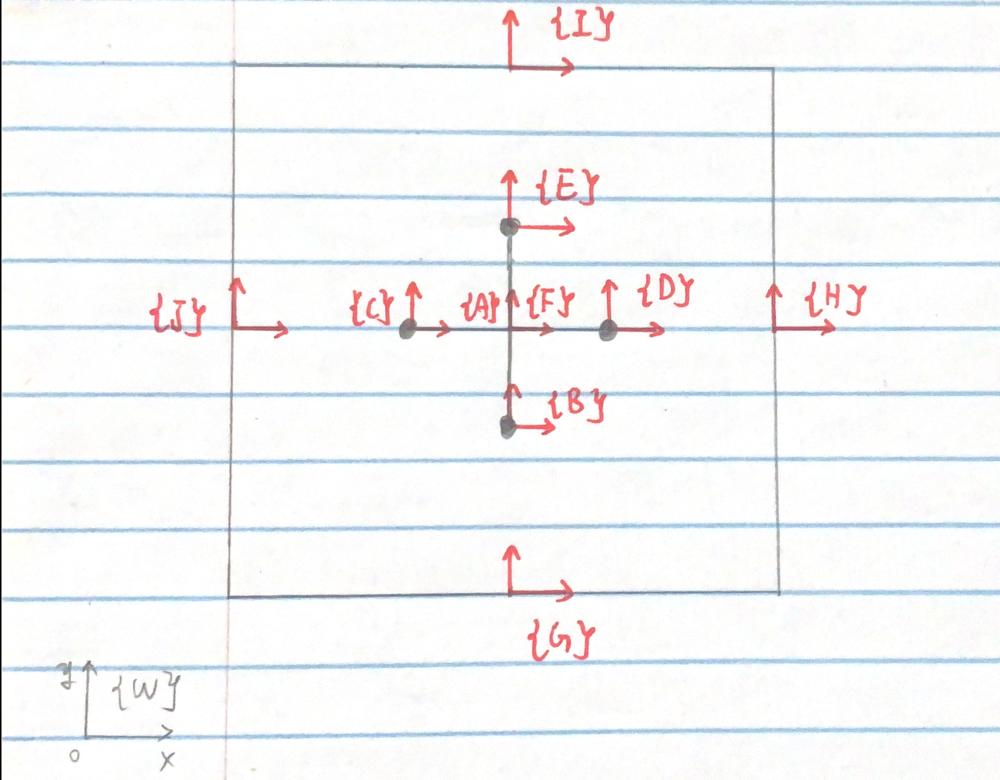

### In this system, frame{A} is the center of the Jack. The frame{F} is the center of the box. I assume in the initial condition the Jack is in the ceter of the box. So frame{A} and frame{F} are coincident temporarily.

In [3]:
# define Inertia matrix, assume rotational inertia of Jack is J = 1
I = Matrix([[m,0,0,0,0,0,],
            [0,m,0,0,0,0,],
            [0,0,m,0,0,0,],
            [0,0,0,1,0,0,],
            [0,0,0,0,1,0,],
            [0,0,0,0,0,1,]
           ])
# get transformation matrixes for jack
gwa = SE3(x2, y2, theta2)

gab = SE3(0, -0.5, 0)
gac = SE3(-0.5, 0, 0)

gad = SE3(0.5, 0, 0)
gae = SE3(0, 0.5, 0)

In [4]:
#calculate KE for {B} frame
gwb = gwa*gab
gwb_inv = inverse_SE3(gwb)
gwb_dot = gwb.diff(t)
Vb_hat = gwb_inv*gwb_dot
Vb_unhat = V_unhat(Vb_hat)
KE_b = 0.5*transpose(Vb_unhat)*I*Vb_unhat
#calculate PE for {B} frame
PE_b = Matrix([m*g*gwb[1,3]])

#calculate KE for {C} frame
gwc = gwa*gac
gwc_inv = inverse_SE3(gwc)
gwc_dot = gwc.diff(t)
Vc_hat = gwc_inv*gwc_dot
Vc_unhat = V_unhat(Vc_hat)
KE_c = 0.5*transpose(Vc_unhat)*I*Vc_unhat
#calculate PE for {C} frame
PE_c = Matrix([m*g*gwc[1,3]])

#calculate KE for {D} frame
gwd = gwa*gad
gwd_inv = inverse_SE3(gwd)
gwd_dot = gwd.diff(t)
Vd_hat = gwd_inv*gwd_dot
Vd_unhat = V_unhat(Vd_hat)
KE_d = 0.5*transpose(Vd_unhat)*I*Vd_unhat
#calculate PE for {D} frame
PE_d = Matrix([m*g*gwd[1,3]])

#calculate KE for {E} frame
gwe = gwa*gae
gwe_inv = inverse_SE3(gwe)
gwe_dot = gwe.diff(t)
Ve_hat = gwe_inv*gwe_dot
Ve_unhat = V_unhat(Ve_hat)
KE_e = 0.5*transpose(Ve_unhat)*I*Ve_unhat
#calculate PE for {E} frame
PE_e = Matrix([m*g*gwe[1,3]])

In [5]:
# define Inertia matrix, assume rotational inertia of Box is J = 1
I = Matrix([[m,0,0,0,0,0,],
            [0,m,0,0,0,0,],
            [0,0,m,0,0,0,],
            [0,0,0,1,0,0,],
            [0,0,0,0,1,0,],
            [0,0,0,0,0,1,]
           ])
# get transformation matrixes for Box
gwf = SE3(x1, y1, theta1)

gfg = SE3(0, -2, 0)
gfh = SE3(2, 0, 0)

gfi = SE3(0, 2, 0)
gfj = SE3(-2, 0, 0)

gfw = inverse_SE3(gwf)

In [6]:
#calculate KE for {G} frame
gwg = gwf*gfg
gwg_inv = inverse_SE3(gwg)
gwg_dot = gwg.diff(t)
Vg_hat = gwg_inv*gwg_dot
Vg_unhat = V_unhat(Vg_hat)
KE_g = 0.5*transpose(Vg_unhat)*I*Vg_unhat
#calculate PE for {G} frame
PE_g = Matrix([m*g*gwg[1,3]])

#calculate KE for {H} frame
gwh = gwf*gfh
gwh_inv = inverse_SE3(gwh)
gwh_dot = gwh.diff(t)
Vh_hat = gwh_inv*gwh_dot
Vh_unhat = V_unhat(Vh_hat)
KE_h = 0.5*transpose(Vh_unhat)*I*Vh_unhat
#calculate PE for {H} frame
PE_h = Matrix([m*g*gwh[1,3]])

#calculate KE for {I} frame
gwi = gwf*gfi
gwi_inv = inverse_SE3(gwi)
gwi_dot = gwi.diff(t)
Vi_hat = gwi_inv*gwi_dot
Vi_unhat = V_unhat(Vi_hat)
KE_i = 0.5*transpose(Vi_unhat)*I*Vi_unhat
#calculate PE for {I} frame
PE_i = Matrix([m*g*gwi[1,3]])

#calculate KE for {J} frame
gwj = gwf*gfj
gwj_inv = inverse_SE3(gwj)
gwj_dot = gwj.diff(t)
Vj_hat = gwj_inv*gwj_dot
Vj_unhat = V_unhat(Vj_hat)
KE_j = 0.5*transpose(Vj_unhat)*I*Vj_unhat
#calculate PE for {J} frame
PE_j = Matrix([m*g*gwj[1,3]])

In [7]:
#calculate Lagrangian equation
L = (KE_b+KE_c+KE_d+KE_e+KE_g+KE_h+KE_i+KE_j)
L = sym.simplify(L)

In [8]:
#define external force
Force2 = 0.5*m*g

In [9]:
# calculate Euler-Lagrangian equation
dLdq =L.jacobian(q)
dLdqdot = L.jacobian(qdot)
lhs = dLdqdot.diff(t) - dLdq
rhs = Matrix([Force2, 0, 0, 0, 0, 0]).T
display(rhs)
el_eqns = Eq(lhs, rhs)

Matrix([[4.905, 0, 0, 0, 0, 0]])

In [10]:
# numerical evaluation 
qddot_soln = solve(el_eqns, [qddot[0], qddot[1], qddot[2], 
                            qddot[3], qddot[4], qddot[5]], dict=True)[0]
x1ddot_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                            qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5]], 
                           qddot_soln[qddot[0]])
y1ddot_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                            qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5]], 
                           qddot_soln[qddot[1]])
theta1ddot_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                            qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5]], 
                           qddot_soln[qddot[2]])

x2ddot_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                            qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5]], 
                           qddot_soln[qddot[3]])
y2ddot_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                            qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5]], 
                           qddot_soln[qddot[4]])
theta2ddot_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                            qdot[0], qdot[1], qdot[2], qdot[3], qdot[4], qdot[5]], 
                           qddot_soln[qddot[5]])


### phi1, phi2, phi3, phi4: b ball impact on the Box

In [11]:
#define impact constraint
gfb= gfw*gwb
phi1 = gfb[1,3]+2
phi1 = sym.simplify(phi1)

phi2 = gfb[1,3]-2
phi2 = sym.simplify(phi2)

phi3 = gfb[0,3]+2
phi3 = sym.simplify(phi3)

phi4 = gfb[0,3]-2
phi4 = sym.simplify(phi4)
# define dummy variables
x1_s, y1_s, theta1_s = symbols(r'x_1, y_1, theta_1')
x2_s, y2_s, theta2_s = symbols(r'x_2, y_2, theta_2')
x1dot, y1dot, theta1dot = symbols(r'\dot{x_1}, \dot{y_1}, \dot{\theta_1}')
x2dot, y2dot, theta2dot = symbols(r'\dot{x_2}, \dot{y_2}, \dot{\theta_2}')
x1ddot, y1ddot, theta1ddot = symbols(r'\ddot{x_1}, \ddot{y_1}, \ddot{\theta_1}')
x2ddot, y2ddot, theta2ddot = symbols(r'\ddot{x_2}, \ddot{y_2}, \ddot{\theta_2}')


dummy_dict = {q[0]:x1_s, q[1]:y1_s, q[2]:theta1_s, q[3]:x2_s, q[4]:y2_s, q[5]:theta2_s,
             qdot[0]:x1dot, qdot[1]:y1dot, qdot[2]:theta1dot,
             qdot[3]:x2dot, qdot[4]:y2dot, qdot[5]:theta2dot,
             qddot[0]:x1ddot, qddot[1]:y1ddot, qddot[2]:theta1ddot,
             qddot[3]:x2ddot, qddot[4]:y2ddot, qddot[5]:theta2ddot,}

phi1_Sym = sym.Matrix([phi1.subs(dummy_dict)])
phi2_Sym = sym.Matrix([phi2.subs(dummy_dict)])
phi3_Sym = sym.Matrix([phi3.subs(dummy_dict)])
phi4_Sym = sym.Matrix([phi4.subs(dummy_dict)])


# compute Hamiltonian
H = dLdqdot*qdot-L
H = sym.simplify(H)

#compute expression
dLdqdot_Sym = dLdqdot.subs(dummy_dict)
                      
dphi1dq_Sym = phi1_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])
dphi2dq_Sym = phi2_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
dphi3dq_Sym = phi3_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
dphi4dq_Sym = phi4_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
                      
H_Sym = H.subs(dummy_dict)                      

# define dummy symbols for tau+
lamb = symbols(r'\lambda')
x1dotPlus, y1dotPlus, theta1dotPlus = \
symbols(r'\dot{x_1}^+, \dot{y_1}^+, \dot{\theta_1}^+')

x2dotPlus, y2dotPlus, theta2dotPlus = \
symbols(r'\dot{x_2}^+, \dot{y_2}^+, \dot{\theta_2}^+')

impact_dict = {x1dot:x1dotPlus, y1dot:y1dotPlus, theta1dot:theta1dotPlus, 
              x2dot:x2dotPlus, y2dot:y2dotPlus, theta2dot:theta2dotPlus}

#evaluate the expression at tau+
dLdqdot_SymPlus = dLdqdot_Sym.subs(impact_dict)
dLdqdot_SymPlus = sym.simplify(dLdqdot_SymPlus)

dphi1dq_SymPlus = dphi1dq_Sym.subs(impact_dict)
dphi1dq_SymPlus = sym.simplify(dphi1dq_SymPlus)
                      
dphi2dq_SymPlus = dphi2dq_Sym.subs(impact_dict)
dphi2dq_SymPlus = sym.simplify(dphi2dq_SymPlus)
                      
dphi3dq_SymPlus = dphi3dq_Sym.subs(impact_dict)
dphi3dq_SymPlus = sym.simplify(dphi3dq_SymPlus)
                      
dphi4dq_SymPlus = dphi4dq_Sym.subs(impact_dict)
dphi4dq_SymPlus = sym.simplify(dphi4dq_SymPlus)
                      
H_SymPlus = H_Sym.subs(impact_dict)
H_SymPlus = sym.simplify(H_SymPlus)

# define equations
lhs = Matrix([dLdqdot_SymPlus[0]-dLdqdot_Sym[0],
             dLdqdot_SymPlus[1]-dLdqdot_Sym[1],
             dLdqdot_SymPlus[2]-dLdqdot_Sym[2],
             dLdqdot_SymPlus[3]-dLdqdot_Sym[3],
             dLdqdot_SymPlus[4]-dLdqdot_Sym[4],
             dLdqdot_SymPlus[5]-dLdqdot_Sym[5],
             H_SymPlus[0]-H_Sym[0]])

rhs1 = Matrix([lamb*dphi1dq_Sym[0],
              lamb*dphi1dq_Sym[1],
              lamb*dphi1dq_Sym[2],
              lamb*dphi1dq_Sym[3],
              lamb*dphi1dq_Sym[4],
              lamb*dphi1dq_Sym[5], 0])
impact_eqns1 = Eq(lhs, rhs1)
impact_eqns1 = sym.simplify(impact_eqns1)
                      
rhs2 = Matrix([lamb*dphi2dq_Sym[0],
              lamb*dphi2dq_Sym[1],
              lamb*dphi2dq_Sym[2],
              lamb*dphi2dq_Sym[3],
              lamb*dphi2dq_Sym[4],
              lamb*dphi2dq_Sym[5], 0])
impact_eqns2 = Eq(lhs, rhs2)
impact_eqns2 = sym.simplify(impact_eqns2)

rhs3 = Matrix([lamb*dphi3dq_Sym[0],
              lamb*dphi3dq_Sym[1],
              lamb*dphi3dq_Sym[2],
              lamb*dphi3dq_Sym[3],
              lamb*dphi3dq_Sym[4],
              lamb*dphi3dq_Sym[5], 0])
impact_eqns3 = Eq(lhs, rhs3)
impact_eqns3 = sym.simplify(impact_eqns3)  
                      
rhs4 = Matrix([lamb*dphi4dq_Sym[0],
              lamb*dphi4dq_Sym[1],
              lamb*dphi4dq_Sym[2],
              lamb*dphi4dq_Sym[3],
              lamb*dphi4dq_Sym[4],
              lamb*dphi4dq_Sym[5], 0])
impact_eqns4 = Eq(lhs, rhs4)
impact_eqns4 = sym.simplify(impact_eqns4)  

#define impact update function
def impact_update1(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
                      
def impact_update2(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])

def impact_update3(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
                      
def impact_update4(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
s_test1 = np.array([0, 0, 0, 3, 3, 0.2, 0, 0.1, 0, 0, -0.1, 0])
display(impact_update1(s_test1, impact_eqns1, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update2(s_test1, impact_eqns2, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update3(s_test1, impact_eqns3, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update4(s_test1, impact_eqns4, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))

array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  3.00000000e+00,
        3.00000000e+00,  2.00000000e-01,  0.00000000e+00, -1.80528838e-03,
       -6.31057319e-02,  0.00000000e+00,  1.80528838e-03,  8.09023541e-03])

array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  3.00000000e+00,
        3.00000000e+00,  2.00000000e-01,  0.00000000e+00, -1.80528838e-03,
       -6.31057319e-02,  0.00000000e+00,  1.80528838e-03,  8.09023541e-03])

Damn only one solution ...


None

Damn only one solution ...


None

### phi5,phi6,phi7,phi8: C ball impact on the Box

In [12]:
#define impact constraint
gfc= gfw*gwc
phi5 = gfc[1,3]+2
phi5 = sym.simplify(phi5)

phi6 = gfc[1,3]-2
phi6 = sym.simplify(phi6)

phi7 = gfc[0,3]+2
phi7 = sym.simplify(phi7)

phi8 = gfc[0,3]-2
phi8 = sym.simplify(phi8)
# define dummy variables
x1_s, y1_s, theta1_s = symbols(r'x_1, y_1, theta_1')
x2_s, y2_s, theta2_s = symbols(r'x_2, y_2, theta_2')
x1dot, y1dot, theta1dot = symbols(r'\dot{x_1}, \dot{y_1}, \dot{\theta_1}')
x2dot, y2dot, theta2dot = symbols(r'\dot{x_2}, \dot{y_2}, \dot{\theta_2}')
x1ddot, y1ddot, theta1ddot = symbols(r'\ddot{x_1}, \ddot{y_1}, \ddot{\theta_1}')
x2ddot, y2ddot, theta2ddot = symbols(r'\ddot{x_2}, \ddot{y_2}, \ddot{\theta_2}')


dummy_dict = {q[0]:x1_s, q[1]:y1_s, q[2]:theta1_s, q[3]:x2_s, q[4]:y2_s, q[5]:theta2_s,
             qdot[0]:x1dot, qdot[1]:y1dot, qdot[2]:theta1dot,
             qdot[3]:x2dot, qdot[4]:y2dot, qdot[5]:theta2dot,
             qddot[0]:x1ddot, qddot[1]:y1ddot, qddot[2]:theta1ddot,
             qddot[3]:x2ddot, qddot[4]:y2ddot, qddot[5]:theta2ddot,}

phi5_Sym = sym.Matrix([phi5.subs(dummy_dict)])
phi6_Sym = sym.Matrix([phi6.subs(dummy_dict)])
phi7_Sym = sym.Matrix([phi7.subs(dummy_dict)])
phi8_Sym = sym.Matrix([phi8.subs(dummy_dict)])


# compute Hamiltonian
H = dLdqdot*qdot-L
H = sym.simplify(H)

#compute expression
dLdqdot_Sym = dLdqdot.subs(dummy_dict)
                      
dphi5dq_Sym = phi5_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])
dphi6dq_Sym = phi6_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
dphi7dq_Sym = phi7_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
dphi8dq_Sym = phi8_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
                      
H_Sym = H.subs(dummy_dict)                      

# define dummy symbols for tau+
lamb = symbols(r'\lambda')
x1dotPlus, y1dotPlus, theta1dotPlus = \
symbols(r'\dot{x_1}^+, \dot{y_1}^+, \dot{\theta_1}^+')

x2dotPlus, y2dotPlus, theta2dotPlus = \
symbols(r'\dot{x_2}^+, \dot{y_2}^+, \dot{\theta_2}^+')

impact_dict = {x1dot:x1dotPlus, y1dot:y1dotPlus, theta1dot:theta1dotPlus, 
              x2dot:x2dotPlus, y2dot:y2dotPlus, theta2dot:theta2dotPlus}

#evaluate the expression at tau+
dLdqdot_SymPlus = dLdqdot_Sym.subs(impact_dict)
dLdqdot_SymPlus = sym.simplify(dLdqdot_SymPlus)

dphi5dq_SymPlus = dphi5dq_Sym.subs(impact_dict)
dphi5dq_SymPlus = sym.simplify(dphi5dq_SymPlus)
                      
dphi6dq_SymPlus = dphi6dq_Sym.subs(impact_dict)
dphi6dq_SymPlus = sym.simplify(dphi6dq_SymPlus)
                      
dphi7dq_SymPlus = dphi7dq_Sym.subs(impact_dict)
dphi7dq_SymPlus = sym.simplify(dphi7dq_SymPlus)
                      
dphi8dq_SymPlus = dphi8dq_Sym.subs(impact_dict)
dphi8dq_SymPlus = sym.simplify(dphi8dq_SymPlus)
                      
H_SymPlus = H_Sym.subs(impact_dict)
H_SymPlus = sym.simplify(H_SymPlus)

# define equations
lhs = Matrix([dLdqdot_SymPlus[0]-dLdqdot_Sym[0],
             dLdqdot_SymPlus[1]-dLdqdot_Sym[1],
             dLdqdot_SymPlus[2]-dLdqdot_Sym[2],
             dLdqdot_SymPlus[3]-dLdqdot_Sym[3],
             dLdqdot_SymPlus[4]-dLdqdot_Sym[4],
             dLdqdot_SymPlus[5]-dLdqdot_Sym[5],
             H_SymPlus[0]-H_Sym[0]])

rhs5 = Matrix([lamb*dphi5dq_Sym[0],
              lamb*dphi5dq_Sym[1],
              lamb*dphi5dq_Sym[2],
              lamb*dphi5dq_Sym[3],
              lamb*dphi5dq_Sym[4],
              lamb*dphi5dq_Sym[5], 0])
impact_eqns5 = Eq(lhs, rhs5)
impact_eqns5 = sym.simplify(impact_eqns5)
                      
rhs6 = Matrix([lamb*dphi6dq_Sym[0],
              lamb*dphi6dq_Sym[1],
              lamb*dphi6dq_Sym[2],
              lamb*dphi6dq_Sym[3],
              lamb*dphi6dq_Sym[4],
              lamb*dphi6dq_Sym[5], 0])
impact_eqns6 = Eq(lhs, rhs6)
impact_eqns6 = sym.simplify(impact_eqns6)

rhs7 = Matrix([lamb*dphi7dq_Sym[0],
              lamb*dphi7dq_Sym[1],
              lamb*dphi7dq_Sym[2],
              lamb*dphi7dq_Sym[3],
              lamb*dphi7dq_Sym[4],
              lamb*dphi7dq_Sym[5], 0])
impact_eqns7 = Eq(lhs, rhs7)
impact_eqns7 = sym.simplify(impact_eqns7)  
                      
rhs8 = Matrix([lamb*dphi8dq_Sym[0],
              lamb*dphi8dq_Sym[1],
              lamb*dphi8dq_Sym[2],
              lamb*dphi8dq_Sym[3],
              lamb*dphi8dq_Sym[4],
              lamb*dphi8dq_Sym[5], 0])
impact_eqns8 = Eq(lhs, rhs8)
impact_eqns8 = sym.simplify(impact_eqns8)  

#define impact update function
def impact_update5(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
                      
def impact_update6(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])

def impact_update7(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
                      
def impact_update8(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
s_test1 = np.array([0, 0, 0, 3, 3, 0.2, 0, 0.1, 0, 0, -0.1, 0])
display(impact_update5(s_test1, impact_eqns5, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update6(s_test1, impact_eqns6, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update7(s_test1, impact_eqns7, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update8(s_test1, impact_eqns8, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))

array([ 0.        ,  0.        ,  0.        ,  3.        ,  3.        ,
        0.2       ,  0.        , -0.01587174, -0.05816684,  0.        ,
        0.01587174, -0.04542481])

array([ 0.        ,  0.        ,  0.        ,  3.        ,  3.        ,
        0.2       ,  0.        , -0.01587174, -0.05816684,  0.        ,
        0.01587174, -0.04542481])

Damn only one solution ...


None

Damn only one solution ...


None

### phi9,phi10,phi11,phi12: d ball impact on the Box

In [13]:
#define impact constraint
gfd= gfw*gwd
phi9 = gfd[1,3]+2
phi9 = sym.simplify(phi9)

phi10 = gfd[1,3]-2
phi10 = sym.simplify(phi10)

phi11 = gfd[0,3]+2
phi11 = sym.simplify(phi11)

phi12 = gfd[0,3]-2
phi12 = sym.simplify(phi12)
# define dummy variables
x1_s, y1_s, theta1_s = symbols(r'x_1, y_1, theta_1')
x2_s, y2_s, theta2_s = symbols(r'x_2, y_2, theta_2')
x1dot, y1dot, theta1dot = symbols(r'\dot{x_1}, \dot{y_1}, \dot{\theta_1}')
x2dot, y2dot, theta2dot = symbols(r'\dot{x_2}, \dot{y_2}, \dot{\theta_2}')
x1ddot, y1ddot, theta1ddot = symbols(r'\ddot{x_1}, \ddot{y_1}, \ddot{\theta_1}')
x2ddot, y2ddot, theta2ddot = symbols(r'\ddot{x_2}, \ddot{y_2}, \ddot{\theta_2}')


dummy_dict = {q[0]:x1_s, q[1]:y1_s, q[2]:theta1_s, q[3]:x2_s, q[4]:y2_s, q[5]:theta2_s,
             qdot[0]:x1dot, qdot[1]:y1dot, qdot[2]:theta1dot,
             qdot[3]:x2dot, qdot[4]:y2dot, qdot[5]:theta2dot,
             qddot[0]:x1ddot, qddot[1]:y1ddot, qddot[2]:theta1ddot,
             qddot[3]:x2ddot, qddot[4]:y2ddot, qddot[5]:theta2ddot,}

phi9_Sym = sym.Matrix([phi9.subs(dummy_dict)])
phi10_Sym = sym.Matrix([phi10.subs(dummy_dict)])
phi11_Sym = sym.Matrix([phi11.subs(dummy_dict)])
phi12_Sym = sym.Matrix([phi12.subs(dummy_dict)])


# compute Hamiltonian
H = dLdqdot*qdot-L
H = sym.simplify(H)

#compute expression
dLdqdot_Sym = dLdqdot.subs(dummy_dict)
                      
dphi9dq_Sym = phi9_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])
dphi10dq_Sym = phi10_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
dphi11dq_Sym = phi11_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
dphi12dq_Sym = phi12_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
                      
H_Sym = H.subs(dummy_dict)                      

# define dummy symbols for tau+
lamb = symbols(r'\lambda')
x1dotPlus, y1dotPlus, theta1dotPlus = \
symbols(r'\dot{x_1}^+, \dot{y_1}^+, \dot{\theta_1}^+')

x2dotPlus, y2dotPlus, theta2dotPlus = \
symbols(r'\dot{x_2}^+, \dot{y_2}^+, \dot{\theta_2}^+')

impact_dict = {x1dot:x1dotPlus, y1dot:y1dotPlus, theta1dot:theta1dotPlus, 
              x2dot:x2dotPlus, y2dot:y2dotPlus, theta2dot:theta2dotPlus}

#evaluate the expression at tau+
dLdqdot_SymPlus = dLdqdot_Sym.subs(impact_dict)
dLdqdot_SymPlus = sym.simplify(dLdqdot_SymPlus)

dphi9dq_SymPlus = dphi9dq_Sym.subs(impact_dict)
dphi9dq_SymPlus = sym.simplify(dphi9dq_SymPlus)
                      
dphi10dq_SymPlus = dphi10dq_Sym.subs(impact_dict)
dphi10dq_SymPlus = sym.simplify(dphi10dq_SymPlus)
                      
dphi11dq_SymPlus = dphi11dq_Sym.subs(impact_dict)
dphi11dq_SymPlus = sym.simplify(dphi11dq_SymPlus)
                      
dphi12dq_SymPlus = dphi12dq_Sym.subs(impact_dict)
dphi12dq_SymPlus = sym.simplify(dphi12dq_SymPlus)
                      
H_SymPlus = H_Sym.subs(impact_dict)
H_SymPlus = sym.simplify(H_SymPlus)

# define equations
lhs = Matrix([dLdqdot_SymPlus[0]-dLdqdot_Sym[0],
             dLdqdot_SymPlus[1]-dLdqdot_Sym[1],
             dLdqdot_SymPlus[2]-dLdqdot_Sym[2],
             dLdqdot_SymPlus[3]-dLdqdot_Sym[3],
             dLdqdot_SymPlus[4]-dLdqdot_Sym[4],
             dLdqdot_SymPlus[5]-dLdqdot_Sym[5],
             H_SymPlus[0]-H_Sym[0]])

rhs9 = Matrix([lamb*dphi9dq_Sym[0],
              lamb*dphi9dq_Sym[1],
              lamb*dphi9dq_Sym[2],
              lamb*dphi9dq_Sym[3],
              lamb*dphi9dq_Sym[4],
              lamb*dphi9dq_Sym[5], 0])
impact_eqns9 = Eq(lhs, rhs9)
impact_eqns9 = sym.simplify(impact_eqns9)
                      
rhs10 = Matrix([lamb*dphi10dq_Sym[0],
              lamb*dphi10dq_Sym[1],
              lamb*dphi10dq_Sym[2],
              lamb*dphi10dq_Sym[3],
              lamb*dphi10dq_Sym[4],
              lamb*dphi10dq_Sym[5], 0])
impact_eqns10 = Eq(lhs, rhs10)
impact_eqns10 = sym.simplify(impact_eqns10)

rhs11 = Matrix([lamb*dphi11dq_Sym[0],
              lamb*dphi11dq_Sym[1],
              lamb*dphi11dq_Sym[2],
              lamb*dphi11dq_Sym[3],
              lamb*dphi11dq_Sym[4],
              lamb*dphi11dq_Sym[5], 0])
impact_eqns11 = Eq(lhs, rhs11)
impact_eqns11 = sym.simplify(impact_eqns11)  
                      
rhs12 = Matrix([lamb*dphi12dq_Sym[0],
              lamb*dphi12dq_Sym[1],
              lamb*dphi12dq_Sym[2],
              lamb*dphi12dq_Sym[3],
              lamb*dphi12dq_Sym[4],
              lamb*dphi12dq_Sym[5], 0])
impact_eqns12 = Eq(lhs, rhs12)
impact_eqns12 = sym.simplify(impact_eqns12)  

#define impact update function
def impact_update9(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
                      
def impact_update10(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])

def impact_update11(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
                      
def impact_update12(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
s_test1 = np.array([0, 0, 0, 3, 3, 0.2, 0, 0.1, 0, 0, -0.1, 0])
display(impact_update9(s_test1, impact_eqns9, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update10(s_test1, impact_eqns10, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update11(s_test1, impact_eqns11, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update12(s_test1, impact_eqns12, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus]))

array([ 0.        ,  0.        ,  0.        ,  3.        ,  3.        ,
        0.2       ,  0.        ,  0.0135728 , -0.06032676,  0.        ,
       -0.0135728 ,  0.03388176])

array([ 0.        ,  0.        ,  0.        ,  3.        ,  3.        ,
        0.2       ,  0.        ,  0.0135728 , -0.06032676,  0.        ,
       -0.0135728 ,  0.03388176])

Damn only one solution ...


None

Damn only one solution ...


None

### phi13,phi14,phi15,phi16: e ball impact on the Box

In [14]:
#define impact constraint
gfe= gfw*gwe
phi13 = gfe[1,3]+2
phi13 = sym.simplify(phi13)

phi14 = gfe[1,3]-2
phi14 = sym.simplify(phi14)

phi15 = gfe[0,3]+2
phi15 = sym.simplify(phi15)

phi16 = gfe[0,3]-2
phi16 = sym.simplify(phi16)
# define dummy variables
x1_s, y1_s, theta1_s = symbols(r'x_1, y_1, theta_1')
x2_s, y2_s, theta2_s = symbols(r'x_2, y_2, theta_2')
x1dot, y1dot, theta1dot = symbols(r'\dot{x_1}, \dot{y_1}, \dot{\theta_1}')
x2dot, y2dot, theta2dot = symbols(r'\dot{x_2}, \dot{y_2}, \dot{\theta_2}')
x1ddot, y1ddot, theta1ddot = symbols(r'\ddot{x_1}, \ddot{y_1}, \ddot{\theta_1}')
x2ddot, y2ddot, theta2ddot = symbols(r'\ddot{x_2}, \ddot{y_2}, \ddot{\theta_2}')


dummy_dict = {q[0]:x1_s, q[1]:y1_s, q[2]:theta1_s, q[3]:x2_s, q[4]:y2_s, q[5]:theta2_s,
             qdot[0]:x1dot, qdot[1]:y1dot, qdot[2]:theta1dot,
             qdot[3]:x2dot, qdot[4]:y2dot, qdot[5]:theta2dot,
             qddot[0]:x1ddot, qddot[1]:y1ddot, qddot[2]:theta1ddot,
             qddot[3]:x2ddot, qddot[4]:y2ddot, qddot[5]:theta2ddot,}

phi13_Sym = sym.Matrix([phi13.subs(dummy_dict)])
phi14_Sym = sym.Matrix([phi14.subs(dummy_dict)])
phi15_Sym = sym.Matrix([phi15.subs(dummy_dict)])
phi16_Sym = sym.Matrix([phi16.subs(dummy_dict)])


# compute Hamiltonian
H = dLdqdot*qdot-L
H = sym.simplify(H)

#compute expression
dLdqdot_Sym = dLdqdot.subs(dummy_dict)
                      
dphi13dq_Sym = phi13_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])
dphi14dq_Sym = phi14_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
dphi15dq_Sym = phi15_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
dphi16dq_Sym = phi16_Sym.jacobian([x1_s, y1_s, theta1_s, x2_s, y2_s, theta2_s])                      
                      
H_Sym = H.subs(dummy_dict)                      

# define dummy symbols for tau+
lamb = symbols(r'\lambda')
x1dotPlus, y1dotPlus, theta1dotPlus = \
symbols(r'\dot{x_1}^+, \dot{y_1}^+, \dot{\theta_1}^+')

x2dotPlus, y2dotPlus, theta2dotPlus = \
symbols(r'\dot{x_2}^+, \dot{y_2}^+, \dot{\theta_2}^+')

impact_dict = {x1dot:x1dotPlus, y1dot:y1dotPlus, theta1dot:theta1dotPlus, 
              x2dot:x2dotPlus, y2dot:y2dotPlus, theta2dot:theta2dotPlus}

#evaluate the expression at tau+
dLdqdot_SymPlus = dLdqdot_Sym.subs(impact_dict)
dLdqdot_SymPlus = sym.simplify(dLdqdot_SymPlus)

dphi13dq_SymPlus = dphi13dq_Sym.subs(impact_dict)
dphi13dq_SymPlus = sym.simplify(dphi13dq_SymPlus)
                      
dphi14dq_SymPlus = dphi14dq_Sym.subs(impact_dict)
dphi14dq_SymPlus = sym.simplify(dphi14dq_SymPlus)
                      
dphi15dq_SymPlus = dphi15dq_Sym.subs(impact_dict)
dphi15dq_SymPlus = sym.simplify(dphi15dq_SymPlus)
                      
dphi16dq_SymPlus = dphi16dq_Sym.subs(impact_dict)
dphi16dq_SymPlus = sym.simplify(dphi16dq_SymPlus)
                      
H_SymPlus = H_Sym.subs(impact_dict)
H_SymPlus = sym.simplify(H_SymPlus)

# define equations
lhs = Matrix([dLdqdot_SymPlus[0]-dLdqdot_Sym[0],
             dLdqdot_SymPlus[1]-dLdqdot_Sym[1],
             dLdqdot_SymPlus[2]-dLdqdot_Sym[2],
             dLdqdot_SymPlus[3]-dLdqdot_Sym[3],
             dLdqdot_SymPlus[4]-dLdqdot_Sym[4],
             dLdqdot_SymPlus[5]-dLdqdot_Sym[5],
             H_SymPlus[0]-H_Sym[0]])

rhs13 = Matrix([lamb*dphi13dq_Sym[0],
              lamb*dphi13dq_Sym[1],
              lamb*dphi13dq_Sym[2],
              lamb*dphi13dq_Sym[3],
              lamb*dphi13dq_Sym[4],
              lamb*dphi13dq_Sym[5], 0])
impact_eqns13 = Eq(lhs, rhs13)
impact_eqns13 = sym.simplify(impact_eqns13)
                      
rhs14 = Matrix([lamb*dphi14dq_Sym[0],
              lamb*dphi14dq_Sym[1],
              lamb*dphi14dq_Sym[2],
              lamb*dphi14dq_Sym[3],
              lamb*dphi14dq_Sym[4],
              lamb*dphi14dq_Sym[5], 0])
impact_eqns14 = Eq(lhs, rhs14)
impact_eqns14 = sym.simplify(impact_eqns14)

rhs15 = Matrix([lamb*dphi15dq_Sym[0],
              lamb*dphi15dq_Sym[1],
              lamb*dphi15dq_Sym[2],
              lamb*dphi15dq_Sym[3],
              lamb*dphi15dq_Sym[4],
              lamb*dphi15dq_Sym[5], 0])
impact_eqns15 = Eq(lhs, rhs15)
impact_eqns15 = sym.simplify(impact_eqns15)  
                      
rhs16 = Matrix([lamb*dphi16dq_Sym[0],
              lamb*dphi16dq_Sym[1],
              lamb*dphi16dq_Sym[2],
              lamb*dphi16dq_Sym[3],
              lamb*dphi16dq_Sym[4],
              lamb*dphi16dq_Sym[5], 0])
impact_eqns16 = Eq(lhs, rhs16)
impact_eqns16 = sym.simplify(impact_eqns16)  

#define impact update function
def impact_update13(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
                      
def impact_update14(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])

def impact_update15(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5],
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
                      
def impact_update16(s, impact_eqns, sym_list):
    subs_dict = {x1_s:s[0], y1_s:s[1], theta1_s:s[2], x2_s:s[3], y2_s:s[4], theta2_s:s[5], 
                 x1dot:s[6], y1dot:s[7], theta1dot:s[8],
                 x2dot:s[9], y2dot:s[10], theta2dot:s[11]}
    new_impact_eqns = impact_eqns.subs(subs_dict)
    impact_solns = sym.solve(new_impact_eqns, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                               x2dotPlus, y2dotPlus, theta2dotPlus,
                                               lamb], dict=True)
    if len(impact_solns) == 1:
        print("Damn only one solution ...")
    else:
        for sol in impact_solns:
            lamb_sol = sol[lamb]
            if abs(lamb_sol) <1e-06:
                pass
            else:
                return np.array([
                    s[0],
                    s[1],
                    s[2],
                    s[3],
                    s[4],
                    s[5],
                    float(sym.N(sol[sym_list[0]])),
                    float(sym.N(sol[sym_list[1]])),
                    float(sym.N(sol[sym_list[2]])),
                    float(sym.N(sol[sym_list[3]])),
                    float(sym.N(sol[sym_list[4]])),
                    float(sym.N(sol[sym_list[5]])),
                ])
s_test1 = np.array([0, 0, 0, 3, 3, 0.2, 0, 0.1, 0, 0, -0.1, 0])
display(impact_update13(s_test1, impact_eqns13, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update14(s_test1, impact_eqns14, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update15(s_test1, impact_eqns15, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus]))
display(impact_update16(s_test1, impact_eqns16, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus]))

array([ 0.        ,  0.        ,  0.        ,  3.        ,  3.        ,
        0.2       ,  0.        , -0.00838153, -0.06287571,  0.        ,
        0.00838153, -0.00861283])

array([ 0.        ,  0.        ,  0.        ,  3.        ,  3.        ,
        0.2       ,  0.        , -0.00838153, -0.06287571,  0.        ,
        0.00838153, -0.00861283])

Damn only one solution ...


None

Damn only one solution ...


None

In [15]:
# define impact condition function
phi1_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi1)
def impact_condition_1(s, threshold=1e-1):
    phi1_val = phi1_func(*s)
    if phi1_val > -threshold and phi1_val < threshold:
        return True
    return False

phi2_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi2)
def impact_condition_2(s, threshold=1e-1):
    phi2_val = phi2_func(*s)
    if phi2_val > -threshold and phi2_val < threshold:
        return True
    return False

phi3_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi3)
def impact_condition_3(s, threshold=1e-1):
    phi3_val = phi3_func(*s)
    if phi3_val > -threshold and phi3_val < threshold:
        return True
    return False

phi4_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi4)
def impact_condition_4(s, threshold=1e-1):
    phi4_val = phi4_func(*s)
    if phi4_val > -threshold and phi4_val < threshold:
        return True
    return False

phi5_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi5)
def impact_condition_5(s, threshold=1e-1):
    phi5_val = phi5_func(*s)
    if phi5_val > -threshold and phi5_val < threshold:
        return True
    return False

phi6_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi6)
def impact_condition_6(s, threshold=1e-1):
    phi6_val = phi6_func(*s)
    if phi6_val > -threshold and phi6_val < threshold:
        return True
    return False

phi7_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi7)
def impact_condition_7(s, threshold=1e-1):
    phi7_val = phi7_func(*s)
    if phi7_val > -threshold and phi7_val < threshold:
        return True
    return False

phi8_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi8)
def impact_condition_8(s, threshold=1e-1):
    phi8_val = phi8_func(*s)
    if phi8_val > -threshold and phi8_val < threshold:
        return True
    return False

phi9_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi9)
def impact_condition_9(s, threshold=1e-1):
    phi9_val = phi9_func(*s)
    if phi9_val > -threshold and phi9_val < threshold:
        return True
    return False

phi10_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi10)
def impact_condition_10(s, threshold=1e-1):
    phi10_val = phi10_func(*s)
    if phi10_val > -threshold and phi10_val < threshold:
        return True
    return False

phi11_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi11)
def impact_condition_11(s, threshold=1e-1):
    phi11_val = phi11_func(*s)
    if phi11_val > -threshold and phi11_val < threshold:
        return True
    return False

phi12_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi12)
def impact_condition_12(s, threshold=1e-1):
    phi12_val = phi12_func(*s)
    if phi12_val > -threshold and phi12_val < threshold:
        return True
    return False

phi13_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi13)
def impact_condition_13(s, threshold=1e-1):
    phi13_val = phi13_func(*s)
    if phi13_val > -threshold and phi13_val < threshold:
        return True
    return False

phi14_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi14)
def impact_condition_14(s, threshold=1e-1):
    phi14_val = phi14_func(*s)
    if phi14_val > -threshold and phi14_val < threshold:
        return True
    return False

phi15_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi15)
def impact_condition_15(s, threshold=1e-1):
    phi15_val = phi15_func(*s)
    if phi15_val > -threshold and phi15_val < threshold:
        return True
    return False

phi16_func = sym.lambdify([q[0], q[1], q[2], q[3], q[4], q[5],
                          qdot[0], qdot[1], qdot[2],
                         qdot[3], qdot[4], qdot[5]], phi16)
def impact_condition_16(s, threshold=1e-1):
    phi16_val = phi16_func(*s)
    if phi16_val > -threshold and phi16_val < threshold:
        return True
    return False

In [16]:
# define dynamics for the particle
def dyn(s):
    return np.array([
        s[6],
        s[7],
        s[8],
        s[9],
        s[10],
        s[11],
        x1ddot_func(*s),
        y1ddot_func(*s),
        theta1ddot_func(*s),
        x2ddot_func(*s),
        y2ddot_func(*s),
        theta2ddot_func(*s)
    ])

def integrate(f, xt, dt):
    k1 = dt * f(xt)
    k2 = dt * f(xt+k1/2.)
    k3 = dt * f(xt+k2/2.)
    k4 = dt * f(xt+k3)
    new_xt = xt + (1/6.) * (k1+2.0*k2+2.0*k3+k4)
    return new_xt

def simulate_with_impact(f, x0, tspan, dt, integrate):
    N = int (( max(tspan)-min(tspan))/dt)
    x = np.copy(x0)
    tvec = np.linspace(min(tspan),max(tspan),N)
    xtraj = np.zeros((len(x0),N))
    for i in range (N):
        if impact_condition_1(x) is True:
            x = impact_update1(x, impact_eqns1, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_2(x) is True:
            x = impact_update2(x, impact_eqns2, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_3(x) is True:
            x = impact_update3(x, impact_eqns3, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_4(x) is True:
            x = impact_update4(x, impact_eqns4, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_5(x) is True:
            x = impact_update5(x, impact_eqns5, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_6(x) is True:
            x = impact_update6(x, impact_eqns6, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_7(x) is True:
            x = impact_update7(x, impact_eqns7, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_8(x) is True:
            x = impact_update8(x, impact_eqns8, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_9(x) is True:
            x = impact_update9(x, impact_eqns9, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                 x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_10(x) is True:
            x = impact_update10(x, impact_eqns10, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                   x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_11(x) is True:
            x = impact_update11(x, impact_eqns11, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                   x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_12(x) is True:
            x = impact_update12(x, impact_eqns12, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                   x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_13(x) is True:
            x = impact_update13(x, impact_eqns13, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                   x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_14(x) is True:
            x = impact_update14(x, impact_eqns14, [x1dotPlus, y1dotPlus, theta1dotPlus, 
                                                   x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_15(x) is True:
            x = impact_update15(x, impact_eqns15, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                   x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        elif impact_condition_16(x) is True:
            x = impact_update16(x, impact_eqns16, [x1dotPlus, y1dotPlus, theta1dotPlus,
                                                   x2dotPlus, y2dotPlus, theta2dotPlus])
            xtraj[:,i]=integrate(f,x,dt)
        else :
            xtraj[:,i]=integrate(f,x,dt)
        x = np.copy(xtraj[:,i])
    return xtraj

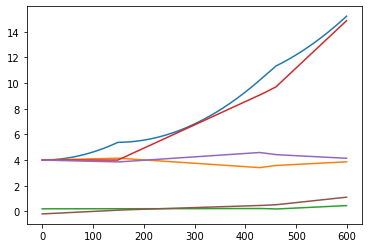

In [17]:
# simulate
s0 = np.array([4,4,0.2,4,4,-0.2,0,0.1,0,0,-0.1,0.2])
traj = simulate_with_impact(dyn, s0, tspan=[0,6], dt=0.01, integrate=integrate)
# plot
import matplotlib.pyplot as plt
plt.plot(np.arange(traj.shape[1]), traj[0:6].T)
plt.show()

In [18]:
def animate_biped(q_array,T=10):
    """
    Function to generate web-based animation of double-pendulum system

    Parameters:
    ================================================
    q_array:
        trajectory of x, y, theta1 and theta2, should be a NumPy array with
        shape of (2,N)
    T:
        length/seconds of animation duration

    Returns: None
    """

    ################################
    # Imports required for animation.
    from plotly.offline import init_notebook_mode, iplot
    from IPython.display import display, HTML
    import plotly.graph_objects as go

    #######################
    # Browser configuration.
    def configure_plotly_browser_state():
        import IPython
        display(IPython.core.display.HTML('''
            <script src="/static/components/requirejs/require.js"></script>
            <script>
              requirejs.config({
                paths: {
                  base: '/static/base',
                  plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
                },
              });
            </script>
            '''))
    configure_plotly_browser_state()
    init_notebook_mode(connected=False)

    ###############################################
    N = len(q_array[0]) # Need this for specifying length of simulation
    

    ###############################################
    # Define arrays containing data for frame axes
    # In each frame, the x and y axis are always fixed
    x_axis = np.array([0.3, 0.0])
    y_axis = np.array([0.0, 0.3])
    
    x_1 = np.array([2,2])
    x_2 = np.array([2,-2])
    x_3 = np.array([-2,-2])
    x_4 = np.array([-2,2])
    
    x_origin = np.array([0, 0])
    y_origin = np.array([0, 0])
    # Use homogeneous tranformation to transfer these two axes/points
    # back to the fixed frame
    # Jack frame
    frame_a_x_axis = np.zeros((2,N))
    frame_a_y_axis = np.zeros((2,N)) 
    frame_a_x_origin = np.zeros((2,N))
    frame_a_y_origin = np.zeros((2,N))
    
    frame_b_x_origin = np.zeros((2,N))
    frame_b_y_origin = np.zeros((2,N))
    frame_b_x_axis = np.zeros((2,N))
    frame_b_y_axis = np.zeros((2,N))
 
    frame_c_x_origin = np.zeros((2,N))
    frame_c_y_origin = np.zeros((2,N))
    frame_c_x_axis = np.zeros((2,N))
    frame_c_y_axis = np.zeros((2,N))
    
    frame_d_x_origin = np.zeros((2,N))
    frame_d_y_origin = np.zeros((2,N))
    frame_d_x_axis = np.zeros((2,N))
    frame_d_y_axis = np.zeros((2,N))
    
    frame_e_x_origin = np.zeros((2,N))
    frame_e_y_origin = np.zeros((2,N))
    frame_e_x_axis = np.zeros((2,N))
    frame_e_y_axis = np.zeros((2,N))
    
    # Box frame
    frame_f_x_origin = np.zeros((2,N))
    frame_f_y_origin = np.zeros((2,N))
    frame_f_x_axis = np.zeros((2,N))
    frame_f_y_axis = np.zeros((2,N))
    
    frame_f_x1 = np.zeros((2,N))
    frame_f_x2 = np.zeros((2,N))
    frame_f_x3 = np.zeros((2,N))
    frame_f_x4 = np.zeros((2,N))
    
    frame_g_x_origin = np.zeros((2,N))
    frame_g_y_origin = np.zeros((2,N))
    frame_g_x_axis = np.zeros((2,N))
    frame_g_y_axis = np.zeros((2,N))
    
    frame_h_x_origin = np.zeros((2,N))
    frame_h_y_origin = np.zeros((2,N))
    frame_h_x_axis = np.zeros((2,N))
    frame_h_y_axis = np.zeros((2,N))
    
    frame_i_x_origin = np.zeros((2,N))
    frame_i_y_origin = np.zeros((2,N))
    frame_i_x_axis = np.zeros((2,N))
    frame_i_y_axis = np.zeros((2,N))
    
    frame_j_x_origin = np.zeros((2,N))
    frame_j_y_origin = np.zeros((2,N))
    frame_j_x_axis = np.zeros((2,N))
    frame_j_y_axis = np.zeros((2,N))
    for i in range(N): # iteration through each time step
        # evaluate Jack homogeneous transformation
        t_wa = np.array([[np.cos(q_array[5][i]), -np.sin(q_array[5][i]), q_array[3][i]],
                        [np.sin(q_array[5][i]),  np.cos(q_array[5][i]), q_array[4][i]],
                        [0, 0, 1]])
        t_ab = np.array([[1, 0, 0],
                        [0, 1, -0.5],
                        [0, 0, 1]])
        t_ac = np.array([[1, 0, -0.5],
                        [0, 1, 0],
                        [0, 0, 1]])
        t_ad = np.array([[1, 0, 0.5],
                        [0, 1, 0],
                        [0, 0, 1]])
        t_ae = np.array([[1, 0, 0],
                        [0, 1, 0.5],
                        [0, 0, 1]])
        # evaluate Box homogeneous transformation
        t_wf = np.array([[np.cos(q_array[2][i]), -np.sin(q_array[2][i]), q_array[0][i]],
                        [np.sin(q_array[2][i]),  np.cos(q_array[2][i]), q_array[1][i]],
                        [0, 0, 1]])
        t_fg = np.array([[1, 0, 0],
                        [0, 1, -3],
                        [0, 0, 1]])
        t_fh = np.array([[1, 0, 3],
                        [0, 1, 0],
                        [0, 0, 1]])
        t_fi = np.array([[1, 0, 0],
                        [0, 1, 3],
                        [0, 0, 1]])
        t_fj = np.array([[1, 0, -3],
                        [0, 1, 0],
                        [0, 0, 1]])
        # transfer the x and y axes in body frame back to fixed frame at 
        # the current time step
        frame_a_x_axis[:,i] = t_wa.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_a_y_axis[:,i] = t_wa.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_a_x_origin[:,i] = t_wa.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_a_y_origin[:,i] = t_wa.dot([y_origin[0], y_origin[1], 1])[0:2]
        
        t_ab = t_wa.dot(t_ab)
        frame_b_x_axis[:,i] = t_ab.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_b_y_axis[:,i] = t_ab.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_b_x_origin[:,i] = t_ab.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_b_y_origin[:,i] = t_ab.dot([y_origin[0], y_origin[1], 1])[0:2]

        t_ac = t_wa.dot(t_ac)
        frame_c_x_axis[:,i] = t_ac.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_c_y_axis[:,i] = t_ac.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_c_x_origin[:,i] = t_ac.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_c_y_origin[:,i] = t_ac.dot([y_origin[0], y_origin[1], 1])[0:2]
                
        t_ad = t_wa.dot(t_ad)
        frame_d_x_axis[:,i] = t_ad.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_d_y_axis[:,i] = t_ad.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_d_x_origin[:,i] = t_ad.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_d_y_origin[:,i] = t_ad.dot([y_origin[0], y_origin[1], 1])[0:2]
        
        t_ae = t_wa.dot(t_ae)
        frame_e_x_axis[:,i] = t_ae.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_e_y_axis[:,i] = t_ae.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_e_x_origin[:,i] = t_ae.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_e_y_origin[:,i] = t_ae.dot([y_origin[0], y_origin[1], 1])[0:2]
        
        # Box frame
        frame_f_x_axis[:,i] = t_wf.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_f_y_axis[:,i] = t_wf.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_f_x_origin[:,i] = t_wf.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_f_y_origin[:,i] = t_wf.dot([y_origin[0], y_origin[1], 1])[0:2]
        
        frame_f_x1[:,i] = t_wf.dot([x_1[0], x_1[1], 1])[0:2]
        frame_f_x2[:,i] = t_wf.dot([x_2[0], x_2[1], 1])[0:2]
        frame_f_x3[:,i] = t_wf.dot([x_3[0], x_3[1], 1])[0:2]
        frame_f_x4[:,i] = t_wf.dot([x_4[0], x_4[1], 1])[0:2]

        
        t_fg = t_wf.dot(t_fg)
        frame_g_x_axis[:,i] = t_fg.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_g_y_axis[:,i] = t_fg.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_g_x_origin[:,i] = t_fg.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_g_y_origin[:,i] = t_fg.dot([y_origin[0], y_origin[1], 1])[0:2]

        t_fh = t_wf.dot(t_fh)
        frame_h_x_axis[:,i] = t_fh.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_h_y_axis[:,i] = t_fh.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_h_x_origin[:,i] = t_fh.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_h_y_origin[:,i] = t_fh.dot([y_origin[0], y_origin[1], 1])[0:2]
                
        t_fi = t_wf.dot(t_fi)
        frame_i_x_axis[:,i] = t_fi.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_i_y_axis[:,i] = t_fi.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_i_x_origin[:,i] = t_fi.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_i_y_origin[:,i] = t_fi.dot([y_origin[0], y_origin[1], 1])[0:2]
        
        t_fj = t_wf.dot(t_fj)
        frame_j_x_axis[:,i] = t_fj.dot([x_axis[0], x_axis[1], 1])[0:2]
        frame_j_y_axis[:,i] = t_fj.dot([y_axis[0], y_axis[1], 1])[0:2]
        frame_j_x_origin[:,i] = t_fj.dot([x_origin[0], x_origin[1], 1])[0:2]
        frame_j_y_origin[:,i] = t_fj.dot([y_origin[0], y_origin[1], 1])[0:2]
        
    ####################################
    # Using these to specify axis limits.
    xm = -3 #np.min(xx1)-0.5
    xM = 3 #np.max(xx1)+0.5
    ym = -3 #np.min(yy1)-2.5
    yM = 3 #np.max(yy1)+1.5

    ###########################
    # Defining data dictionary.
    # Trajectories are here.
    data=[
        # note that except for the trajectory (which you don't need this time),
        # you don't need to define entries other than "name". The items defined
        # in this list will be related to the items defined in the "frames" list
        # later in the same order. Therefore, these entries can be considered as 
        # labels for the components in each animation frame
        dict(name='World Frame X'),
        dict(name='World Frame Y'),
        dict(name='Mass 1'),
        dict(name='Mass 2'),
        dict(name='Mass 3'),
        dict(name='Mass 4'),
        dict(name='line1'),
        dict(name='line2'),
        dict(name='line3'),
        dict(name='line4'),
        dict(name='lineF1'),
        dict(name='lineF2'),
        dict(name='lineF3'),
        dict(name='lineF4'),
        # You don't need to show trajectory this time,
        # but if you want to show the whole trajectory in the animation (like what
        # you did in previous homeworks), you will need to define entries other than 
        # "name", such as "x", "y". and "mode".

        # dict(x=xx1, y=yy1, 
        #      mode='markers', name='Pendulum 1 Traj', 
        #      marker=dict(color="fuchsia", size=2)
        #     ),
        # dict(x=xx2, y=yy2, 
        #      mode='markers', name='Pendulum 2 Traj', 
        #      marker=dict(color="purple", size=2)
        #     ),
        ]

    ################################
    # Preparing simulation layout.
    # Title and axis ranges are here.
    layout=dict(autosize=False, width=1000, height=1000,
                xaxis=dict(range=[xm, xM], autorange=False, zeroline=False,dtick=1),
                yaxis=dict(range=[ym, yM], autorange=False, zeroline=False,scaleanchor = "x",dtick=1),
                title='Double Pendulum Simulation', 
                hovermode='closest',
                updatemenus= [{'type': 'buttons',
                               'buttons': [{'label': 'Play','method': 'animate',
                                            'args': [None, {'frame': {'duration': T, 'redraw': False}}]},
                                           {'args': [[None], {'frame': {'duration': T, 'redraw': False}, 'mode': 'immediate',
                                            'transition': {'duration': 0}}],'label': 'Pause','method': 'animate'}
                                          ]
                              }]
               )

    ########################################
    # Defining the frames of the simulation.
    # This is what draws the lines from
    # joint to joint of the pendulum.
    frames=[dict(data=[# first three objects correspond to the arms and two masses,
                       # same order as in the "data" variable defined above (thus 
                       # they will be labeled in the same order)
                       # display x and y axes of the fixed frame in each animation frame
                       dict(x=[0,x_axis[0]], 
                            y=[0,x_axis[1]], 
                            mode='lines',
                            line=dict(color='green', width=3),
                            ),
                       dict(x=[0,y_axis[0]], 
                            y=[0,y_axis[1]], 
                            mode='lines',
                            line=dict(color='red', width=3),
                            ),
                       go.Scatter(
                            x=[frame_b_x_origin[0][k]],
                            y=[frame_b_y_origin[1][k]],
                            mode="markers",
                            marker=dict(color="blue", size=10)),
                       go.Scatter(
                            x=[frame_c_x_origin[0][k]],
                            y=[frame_c_y_origin[1][k]],
                            mode="markers",
                            marker=dict(color="blue", size=10)),
                       go.Scatter(
                            x=[frame_d_x_origin[0][k]],
                            y=[frame_d_y_origin[1][k]],
                            mode="markers",
                            marker=dict(color="blue", size=10)),
                       go.Scatter(
                            x=[frame_e_x_origin[0][k]],
                            y=[frame_e_y_origin[1][k]],
                            mode="markers",
                            marker=dict(color="blue", size=10)),
                       dict(x=[frame_a_x_origin[0][k], frame_b_x_origin[0][k]],
                            y=[frame_a_y_origin[1][k], frame_b_y_origin[1][k]],
                              mode = 'lines',
                              line=dict(color='orange', width=3),
                           ),
                       dict(x=[frame_a_x_origin[0][k], frame_c_x_origin[0][k]],
                            y=[frame_a_y_origin[1][k], frame_c_y_origin[1][k]],
                              mode = 'lines',
                              line=dict(color='orange', width=3),
                           ),
                       dict(x=[frame_a_x_origin[0][k], frame_d_x_origin[0][k]],
                            y=[frame_a_y_origin[1][k], frame_d_y_origin[1][k]],
                              mode = 'lines',
                              line=dict(color='orange', width=3),
                           ),
                       dict(x=[frame_a_x_origin[0][k], frame_e_x_origin[0][k]],
                            y=[frame_a_y_origin[1][k], frame_e_y_origin[1][k]],
                              mode = 'lines',
                              line=dict(color='orange', width=3),
                           ),
                       dict(x=[frame_f_x1[0][k], frame_f_x2[0][k]],
                            y=[frame_f_x1[1][k], frame_f_x2[1][k]],
                            mode='lines',
                            line=dict(color='red', width=3),
                           ),
                       dict(x=[frame_f_x2[0][k], frame_f_x3[0][k]],
                            y=[frame_f_x2[1][k], frame_f_x3[1][k]],
                            mode='lines',
                            line=dict(color='red', width=3),
                           ),
                       dict(x=[frame_f_x3[0][k], frame_f_x4[0][k]],
                            y=[frame_f_x3[1][k], frame_f_x4[1][k]],
                            mode='lines',
                            line=dict(color='red', width=3),
                           ),
                       dict(x=[frame_f_x4[0][k], frame_f_x1[0][k]],
                            y=[frame_f_x4[1][k], frame_f_x1[1][k]],
                            mode='lines',
                            line=dict(color='red', width=3),
                           ),

                        ]) for k in range(N)]
    #######################################
    # Putting it all together and plotting.
    figure1=dict(data=data, layout=layout, frames=frames)           
    iplot(figure1)

import numpy as np
sim_traj = traj
print('shape of trajectory: ', sim_traj.shape)
# second, animate!
animate_biped(sim_traj, T=10)

shape of trajectory:  (12, 600)
